# Crop Field Contrastive Learning with Graph-based segmentation

This notebook is part of the field boundary detection project. The goal is to evaluate the algorithm using single samples (1D) instead of 2D combining time series of the same h3 hex AND semi-supervised contrastive learning with Graph-based segmentation.

## Load required libraries

In [1]:
import sys

# Install packages required only once
install_packages = False

if install_packages:
    !{sys.executable} -m pip install sklearn
    !{sys.executable} -m pip install seaborn

In [2]:
import math
import matplotlib.pyplot as plt

import tensorflow as tf
import tensorflow_datasets as tfds
from tensorflow import keras
from tensorflow.keras import layers

import pandas as pd
import numpy as np

import folium
import h3

## Configure the train and test datasets

In [3]:
from pathlib import Path
parquet_dir_training = Path('D:\\hexes_with_pixels_s2\\hex_index_L3=832a89fffffffff')
parquet_dir_validation = Path('D:\\hexes_with_pixels_s2\\hex_index_L3=832a90fffffffff')

## Load all parquet files from the configured folder

In [4]:
df = pd.concat(
            pd.read_parquet(parquet_file)
            for parquet_file in parquet_dir_training.glob('*.parquet')
         )

display(df.head(5))
print(df.shape)

,start_date,end_date,FIELD_OPERATION_GUID,scene_id,hex,SCL_val,s2_tile,B01,B02,B03,B04,B05,B06,B07,B08,B8A,B09,B11,B12
0,2020-07-11T19:25:31.600000+00:00,2021-07-18T22:12:40.268000+00:00,07571e4f-0822-4803-aa14-c0cd079e414c 2020-11-08,S2A_MSIL2A_20200712T155911_N0214_R097_T17SQA_2...,8c2a891134001ff,4,17SQA,733.0,1005.0,1648.0,1626.0,2284.0,4004.0,4304.0,4352.0,4589.0,4563.0,3291.0,2215.0
1,2020-07-11T19:25:31.600000+00:00,2021-07-18T22:12:40.268000+00:00,07571e4f-0822-4803-aa14-c0cd079e414c 2020-11-08,S2A_MSIL2A_20200712T155911_N0214_R097_T17SQA_2...,8c2a891134003ff,4,17SQA,733.0,893.0,1566.0,1484.0,1953.0,3775.0,4208.0,4464.0,4457.0,4563.0,3076.0,1952.0
2,2020-07-11T19:25:31.600000+00:00,2021-07-18T22:12:40.268000+00:00,07571e4f-0822-4803-aa14-c0cd079e414c 2020-11-08,S2A_MSIL2A_20200712T155911_N0214_R097_T17SQA_2...,8c2a891134005ff,4,17SQA,714.0,469.0,911.0,664.0,1527.0,3296.0,3777.0,3946.0,4145.0,4273.0,2715.0,1561.0
3,2020-07-11T19:25:31.600000+00:00,2021-07-18T22:12:40.268000+00:00,07571e4f-0822-4803-aa14-c0cd079e414c 2020-11-08,S2A_MSIL2A_20200712T155911_N0214_R097_T17SQA_2...,8c2a891134007ff,4,17SQA,714.0,469.0,911.0,664.0,1527.0,3296.0,3777.0,4052.0,4145.0,4273.0,2715.0,1561.0
4,2020-07-11T19:25:31.600000+00:00,2021-07-18T22:12:40.268000+00:00,07571e4f-0822-4803-aa14-c0cd079e414c 2020-11-08,S2A_MSIL2A_20200712T155911_N0214_R097_T17SQA_2...,8c2a891134009ff,4,17SQA,733.0,937.0,1550.0,1522.0,2450.0,4127.0,4493.0,4368.0,4633.0,4563.0,3493.0,2380.0


(123663, 19)


In [5]:
print('In this dataset there are ', df.hex.unique().size, ' different hexes')

In this dataset there are  2054  different hexes


In [6]:
temporal_samples = []
for h in df.hex.unique():
    temporal_samples.append(sum(df['hex']==h))
    
print('There are hexes with temporal samples from : ', min(temporal_samples), ' to ', max(temporal_samples))

There are hexes with temporal samples from :  37  to  110


## Show some of the L12 hexes loaded in the folium map

In [7]:
center = h3.h3_to_geo_boundary(h=df.iloc[0]['hex'],geo_json=True)

df = df.drop_duplicates(subset='hex', keep="first")

m = folium.Map(location=(center[0][1], center[0][0]),
                tiles = 'https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
                attr = 'Esri',
                name = 'Esri Satellite',
                zoom_start=16,
                overlay = False,
                control = True)

for index, row in df.iterrows():
    geometry = { "type" : "Polygon", "coordinates": [h3.h3_to_geo_boundary(h=row['hex'],geo_json=True)]}
    geo_j = folium.GeoJson(data=geometry, style_function=lambda x: {'fillColor': 'orange', 'color': 'green', 'weight': 0.5})
    folium.Popup(str(row['hex'])).add_to(geo_j)
    geo_j.add_to(m)

m

## Manually get a few labels just for testing

TBD: Extract labels using PAAW machine data

In [8]:
# a few manually labeled positive samples
positive_samples = [
                    '8c2a89113412bff', 
                    '8c2a891134069ff', 
                    '8c2a8911340cbff',
                    '8c2a891a86199ff',
                    '8c2a891acbb5dff', 
                    '8c2a891acba3dff', 
                    '8c2a891aa918bff', 
                    '8c2a891a85969ff'
                    ]

# a few manually labeled negative samples usually located close to the boundary
negative_samples = [
                    '8c2a891134ad3ff', 
                    '8c2a891a8c515ff', 
                    '8c2a891a8c509ff', 
                    '8c2a891a8c55bff', 
                    '8c2a891ae2d19ff', 
                    '8c2a891a86eb7ff', 
                    '8c2a891a82a67ff',
                    '8c2a891a82b53ff',
                    '8c2a891134ae3ff', 
                    '8c2a891a86ccbff', 
                    '8c2a891a86ea5ff',
                    '8c2a891a861a1ff', 
                    '8c2a891aa9a8bff',
                    '8c2a891aa9ac1ff'
                    ]

In [9]:
center = h3.h3_to_geo_boundary(h=df.iloc[0]['hex'],geo_json=True)

df = df.drop_duplicates(subset='hex', keep="first")

df_positive = df.loc[df['hex'].isin(positive_samples)]
df_negative = df.loc[df['hex'].isin(negative_samples)]

m = folium.Map(location=(center[0][1], center[0][0]),
                tiles = 'https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
                attr = 'Esri',
                name = 'Esri Satellite',
                zoom_start=16,
                overlay = False,
                control = True)

# Print positive samples
for index, row in df_positive.iterrows():
    geometry = { "type" : "Polygon", "coordinates": [h3.h3_to_geo_boundary(h=row['hex'],geo_json=True)]}
    geo_j = folium.GeoJson(data=geometry, style_function=lambda x: {'fillColor': 'yellow', 'color': 'green', 'weight': 0.5})
    folium.Popup(str(row['hex'])).add_to(geo_j)
    geo_j.add_to(m)
    
# Print negative samples
for index, row in df_negative.iterrows():
    geometry = { "type" : "Polygon", "coordinates": [h3.h3_to_geo_boundary(h=row['hex'],geo_json=True)]}
    geo_j = folium.GeoJson(data=geometry, style_function=lambda x: {'fillColor': 'red', 'color': 'black', 'weight': 0.5})
    folium.Popup(str(row['hex'])).add_to(geo_j)
    geo_j.add_to(m)

m

# Visualize the samples in the space reduced to 2 dimensions

Positive labeled samples: 679
Negative labeled samples: 763
Unlabeled labeled samples: 122221


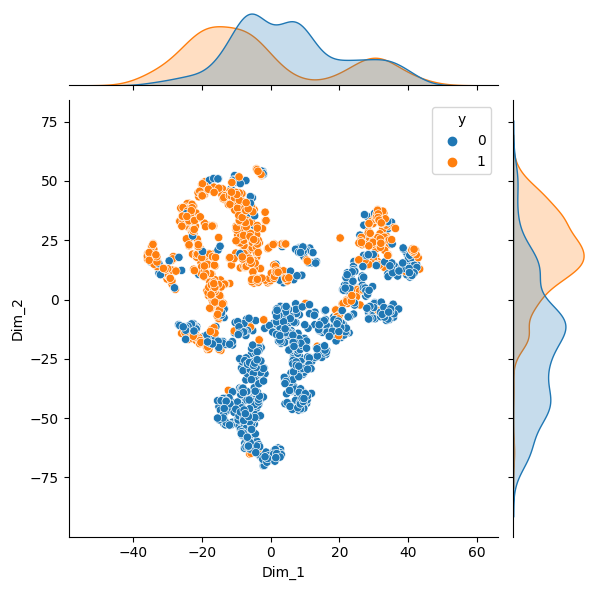

In [10]:
from sklearn.manifold import TSNE
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
df = pd.concat(
            pd.read_parquet(parquet_file)
            for parquet_file in parquet_dir_training.glob('*.parquet')
         )
df['y'] = np.where(np.isin(df['hex'],positive_samples), 1, -1)
df['y'] = np.where(df['hex'].isin(negative_samples), 0, df['y'])
df_labeled = df[df.y != -1]
df_labeled_features = df_labeled[['B01','B02','B03','B04','B05','B06','B07','B08','B8A','B09','B11','B12', 'y']].astype('int')
df_labels = df_labeled[['y']].astype('int')
df_labels = df_labels.reset_index(drop=True)

print('Positive labeled samples:', sum(df.y==1))
print('Negative labeled samples:', sum(df.y==0))
print('Unlabeled labeled samples:', sum(df.y==-1))

model = TSNE(n_components=2, random_state=0)
tsne_data = model.fit_transform(df_labeled_features.drop(columns=['y']))
tsne_df = pd.DataFrame(data=tsne_data, columns=("Dim_1", "Dim_2"))
tsne_data = pd.concat([tsne_df, df_labels], axis=1)
tsne_df = pd.DataFrame(data=tsne_data, columns=("Dim_1", "Dim_2", "y"))


sns.jointplot(data=tsne_df, x="Dim_1", y="Dim_2", hue='y')
plt.show()
warnings.filterwarnings('default')


,B01,B02,B03,B04,B05,B06,B07,B08,B8A,B09,B11,B12,y
0,722,977,1630,1686,2502,3986,4366,4468,4571,4518,3540,2422,1
1,634,779,1426,1388,2284,3876,4269,4184,4363,4281,3319,2107,1
2,773,899,1562,1522,2411,4147,4546,4364,4670,4487,3476,2217,1
3,549,275,570,357,979,3006,3714,3826,4108,4162,2011,1070,0
4,378,211,489,263,1140,3155,3887,3996,4149,3993,2275,1203,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1437,730,965,1332,1688,2239,2561,2854,2942,3245,3213,3927,2644,1
1438,437,628,944,1015,1354,3055,3770,3662,4171,4059,2979,1744,0
1439,371,437,701,575,1083,3404,4399,3909,4720,4404,2635,1347,0
1440,2167,2208,2452,2450,2729,3611,4089,4123,4295,4374,4102,3089,1


<AxesSubplot:xlabel='variable', ylabel='value'>

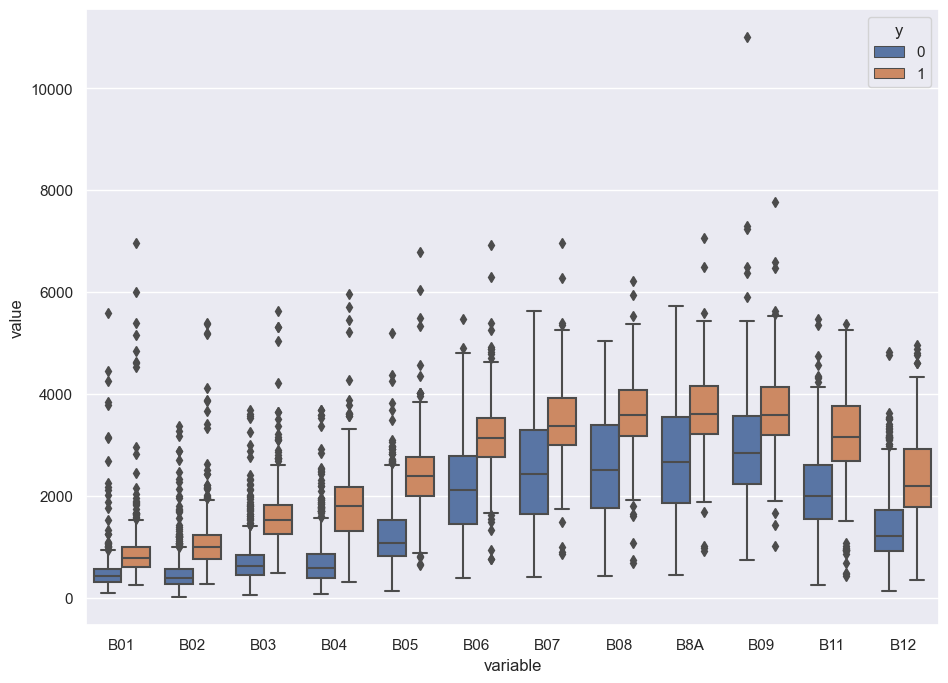

In [11]:
import pandas as pd
import seaborn as sns

df_labeled_features = df_labeled_features.reset_index(drop=True)
display(df_labeled_features)

value_vars = df_labeled_features.columns[df_labeled_features.columns != 'y']
id_vars = ['y']
data = pd.melt(df_labeled_features, id_vars=id_vars, value_vars=value_vars)

sns.set(rc={'figure.figsize':(11,8)})
sns.boxplot(x="variable", y="value", hue='y', data=data)
#sns.violinplot(x="variable", y="value", hue='y', data=data, split=True)



# Check correlation among bands

<AxesSubplot:>

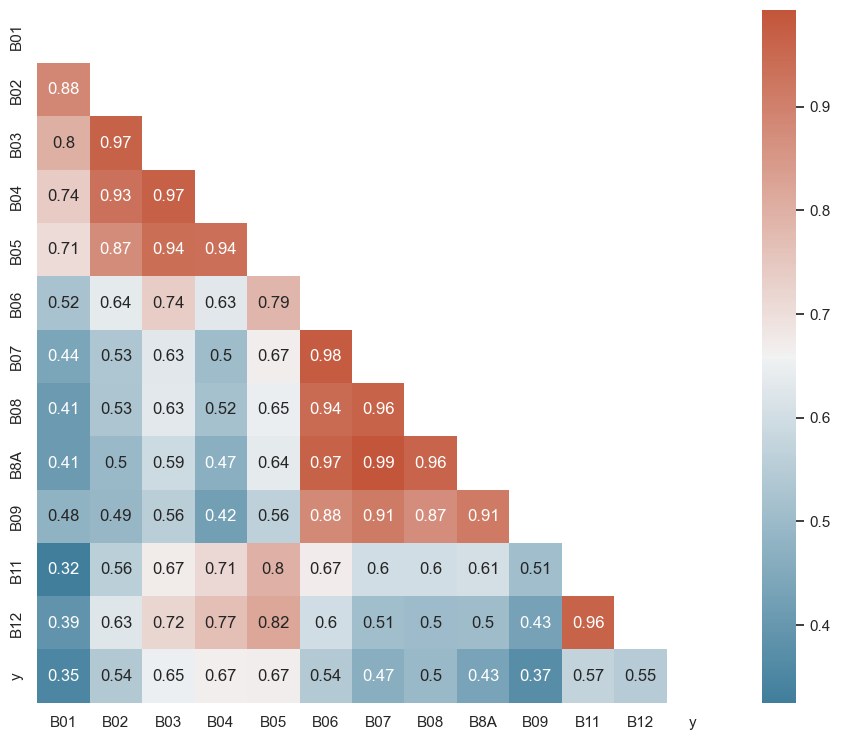

In [12]:

sns.set_theme(style="white")
# Compute the correlation matrix
corr = df_labeled_features.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
#sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
#            square=True, linewidths=.5, cbar_kws={"shrink": .5})

sns.heatmap(corr,mask=mask,cmap=cmap, annot=True )

<AxesSubplot:>

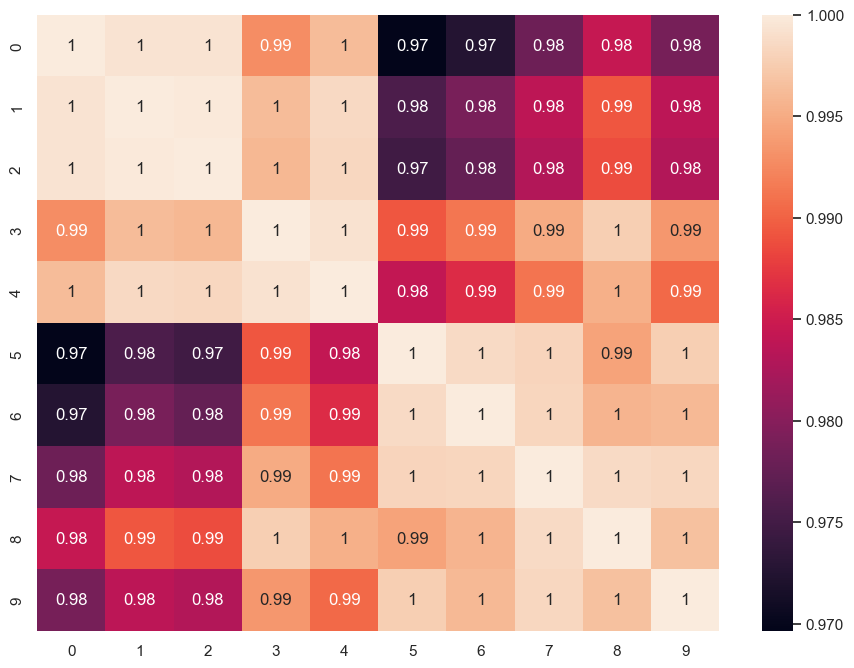

In [13]:
from sklearn import preprocessing
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics.pairwise import euclidean_distances

df_labeled_features = df_labeled_features.reset_index(drop=True)
value_vars = df_labeled_features.columns[df_labeled_features.columns != 'y']

df_sample_five_positive = df_labeled_features.loc[df_labeled_features['y'] == 1].head(5)
df_sample_five_negative = df_labeled_features.loc[df_labeled_features['y'] == 0].head(5)
df_subsample = pd.concat([df_sample_five_positive, df_sample_five_negative])

similarities = cosine_similarity(df_subsample, df_subsample)
#similarities = euclidean_distances(df_labeled_features_noclass, df_labeled_features_noclass) / 1000
sns.heatmap(similarities, annot=True )   

## Hyper-parameters and other constants

In [14]:
image_size = 12 # 12 bands
image_channels = 1 # 1 channel
width = 12 # output vector size
temperature = 0.1 # empirical temperature value

steps_per_epoch = 20
AUTOTUNE = tf.data.AUTOTUNE
shuffle_buffer = 50
input_shape = (12,1)
num_epochs = 100


queue_size = 10000
contrastive_augmentation = {"jitter": 0.2}
classification_augmentation = {"jitter": 0.1}

## Prepare the Dataset

In [15]:
def prepare_dataset():

    df = pd.concat(
            pd.read_parquet(parquet_file)
            for parquet_file in parquet_dir_training.glob('*.parquet')
         )
    
    df['y'] = np.where(np.isin(df['hex'],positive_samples), 1, -1)
    df['y'] = np.where(df['hex'].isin(negative_samples), 0, df['y'])
    
    print('Positive labeled samples:', sum(df.y==1))
    print('Negative labeled samples:', sum(df.y==0))
    print('Unlabeled labeled samples:', sum(df.y==-1))
    
    df_labeled = df[df.y != -1]
    df_unlabeled = df[df.y == -1]
    
    df_labeled = df_labeled[['B01','B02','B03','B04','B05','B06','B07','B08','B8A','B09','B11','B12', 'y']].astype('int')
    df_unlabeled = df_unlabeled[['B01','B02','B03','B04','B05','B06','B07','B08','B8A','B09','B11','B12', 'y']].astype('int')
    
    df_labeled_X_array = df_labeled.loc[:,df_labeled.columns != 'y']
    
    df_unlabeled_X_array = df_unlabeled.loc[:,df_unlabeled.columns != 'y']
    
    unlabeled_train_images = df_unlabeled.shape[0]
    labeled_train_images = df_labeled.shape[0]
    
    unlabeled_batch_size = unlabeled_train_images // steps_per_epoch
    labeled_batch_size = labeled_train_images // steps_per_epoch
    batch_size = unlabeled_batch_size + labeled_batch_size
    

    unlabeled_train_dataset = tf.data.Dataset\
        .from_tensor_slices((df_unlabeled_X_array, 
                            df_unlabeled.loc[:,df_unlabeled.columns == 'y'].values.T[0]))\
        .shuffle(50)\
        .batch(50, drop_remainder=True)
    
    labeled_train_dataset = tf.data.Dataset\
        .from_tensor_slices((df_labeled_X_array,
                             df_labeled.loc[:,df_labeled.columns == 'y'].values.T[0]))\
        .shuffle(50)\
        .batch(50, drop_remainder=True)
    
    test_dataset = tf.data.Dataset\
        .from_tensor_slices((df_labeled_X_array,
                             df_labeled.loc[:,df_labeled.columns == 'y'].values.T[0]))\
        .batch(50)\
        .prefetch(buffer_size=tf.data.AUTOTUNE)
    
   
    train_dataset = tf.data.Dataset.zip(
        (unlabeled_train_dataset,labeled_train_dataset)
    ).prefetch(buffer_size=AUTOTUNE)

    return batch_size, train_dataset, labeled_train_dataset, test_dataset

    
    
batch_size, train_dataset, labeled_train_dataset, test_dataset = prepare_dataset()

Positive labeled samples: 679
Negative labeled samples: 763
Unlabeled labeled samples: 122221


In [41]:
# Distorts the color distibutions of images
class RandomAugmentSatelliteBands(layers.Layer):
    def __init__(self, jitter=0, **kwargs):
        super().__init__(**kwargs)

        self.jitter = jitter

    def get_config(self):
        config = super().get_config()
        config.update({"jitter": self.jitter})
        return config

    def call(self, images, training=True):
        if training:
            batch_size = tf.shape(images)[0]

            jitter_matrices = tf.random.uniform(
                (batch_size, image_size, 1), minval=1 - self.jitter, maxval=1 + self.jitter
            )
            
            images = tf.round(images * jitter_matrices)
            
        return images

# Define the encoder architecture
def get_encoder():
    return keras.Sequential(
        [
            keras.Input(shape=(image_size, image_channels)),
            layers.Conv1D(width, kernel_size=1, strides=2, activation="relu"),
            layers.Conv1D(width, kernel_size=1, strides=2, activation="relu"),
            layers.Conv1D(width, kernel_size=1, strides=2, activation="relu"),
            layers.Conv1D(width, kernel_size=1, strides=2, activation="relu"),
            layers.Flatten(),
            layers.Dense(width, activation="relu"),
        ],
        name="encoder",
    )

# Image augmentation module
def get_augmenter(jitter):
    return keras.Sequential(
        [
            keras.Input(shape=(image_size, image_channels)),
            RandomAugmentSatelliteBands(jitter),
        ]
    )


In [42]:
# Define the contrastive model with model-subclassing
class ContrastiveModel(keras.Model):
    def __init__(self):
        super().__init__()

        self.temperature = temperature
        self.contrastive_augmenter = get_augmenter(**contrastive_augmentation)
        self.classification_augmenter = get_augmenter(**classification_augmentation)
        self.encoder = get_encoder()
        # Non-linear MLP as projection head
        self.projection_head = keras.Sequential(
            [
                keras.Input(shape=(width,)),
                layers.Dense(width, activation="relu"),
                layers.Dense(width),
            ],
            name="projection_head",
        )
        # Single dense layer for linear probing
        self.linear_probe = keras.Sequential(
            [layers.Input(shape=(width,)), layers.Dense(2)], name="linear_probe"
        )

        self.encoder.summary()
        self.projection_head.summary()
        self.linear_probe.summary()

    def compile(self, contrastive_optimizer, probe_optimizer, **kwargs):
        super().compile(**kwargs)

        self.contrastive_optimizer = contrastive_optimizer
        self.probe_optimizer = probe_optimizer

        # self.contrastive_loss will be defined as a method
        self.probe_loss = keras.losses.SparseCategoricalCrossentropy(from_logits=True)

        self.contrastive_loss_tracker = keras.metrics.Mean(name="c_loss")
        self.contrastive_accuracy = keras.metrics.SparseCategoricalAccuracy(
            name="c_acc"
        )
        self.probe_loss_tracker = keras.metrics.Mean(name="p_loss")
        self.probe_accuracy = keras.metrics.SparseCategoricalAccuracy(name="p_acc")

    @property
    def metrics(self):
        return [
            self.contrastive_loss_tracker,
            self.contrastive_accuracy,
            self.probe_loss_tracker,
            self.probe_accuracy,
        ]

    def contrastive_loss(self, projections_1, projections_2):
        # InfoNCE loss (information noise-contrastive estimation)
        # NT-Xent loss (normalized temperature-scaled cross entropy)

        # Cosine similarity: the dot product of the l2-normalized feature vectors
        projections_1 = tf.math.l2_normalize(projections_1, axis=1)
        projections_2 = tf.math.l2_normalize(projections_2, axis=1)
        
        
        similarities = (
            tf.matmul(projections_1, projections_2, transpose_b=True) / self.temperature
        )        

        # The similarity between the representations of two augmented views of the
        # same hex should be higher than their similarity with other views
        batch_size = tf.shape(projections_1)[0]
    
        contrastive_labels = tf.range(batch_size)
        self.contrastive_accuracy.update_state(contrastive_labels, similarities)
        self.contrastive_accuracy.update_state(contrastive_labels, tf.transpose(similarities))

        # The temperature-scaled similarities are used as logits for cross-entropy
        # a symmetrized version of the loss is used here
        loss_1_2 = keras.losses.sparse_categorical_crossentropy(
            contrastive_labels, similarities, from_logits=True
        )
        
        loss_2_1 = keras.losses.sparse_categorical_crossentropy(
            contrastive_labels, tf.transpose(similarities), from_logits=True
        )
        
        
        return (loss_1_2 + loss_2_1) / 2

    def train_step(self, data):
        (unlabeled_images, _), (labeled_images, labels) = data

        # Both labeled and unlabeled images are used, without labels
        images = tf.concat((unlabeled_images, labeled_images), axis=0)
        # Each image is augmented twice, differently
        augmented_images_1 = self.contrastive_augmenter(images, training=True)
        augmented_images_2 = self.contrastive_augmenter(images, training=True)
        
        
        with tf.GradientTape() as tape:
            features_1 = self.encoder(augmented_images_1, training=True)
            features_2 = self.encoder(augmented_images_2, training=True)
            # The representations are passed through a projection mlp
            projections_1 = self.projection_head(features_1, training=True)
            projections_2 = self.projection_head(features_2, training=True)
            contrastive_loss = self.contrastive_loss(projections_1, projections_2)
        gradients = tape.gradient(
            contrastive_loss,
            self.encoder.trainable_weights + self.projection_head.trainable_weights,
        )
        self.contrastive_optimizer.apply_gradients(
            zip(
                gradients,
                self.encoder.trainable_weights + self.projection_head.trainable_weights,
            )
        )
        self.contrastive_loss_tracker.update_state(contrastive_loss)

        # Labels are only used in evalutation for an on-the-fly logistic regression
        preprocessed_images = self.classification_augmenter(
            labeled_images, training=True
        )
        with tf.GradientTape() as tape:
            # the encoder is used in inference mode here to avoid regularization
            # and updating the batch normalization paramers if they are used
            features = self.encoder(preprocessed_images, training=False)
            class_logits = self.linear_probe(features, training=True)
            probe_loss = self.probe_loss(labels, class_logits)
        gradients = tape.gradient(probe_loss, self.linear_probe.trainable_weights)
        self.probe_optimizer.apply_gradients(
            zip(gradients, self.linear_probe.trainable_weights)
        )
        self.probe_loss_tracker.update_state(probe_loss)
        self.probe_accuracy.update_state(labels, class_logits)

        return {m.name: m.result() for m in self.metrics}

    def test_step(self, data):
        labeled_images, labels = data

        # For testing the components are used with a training=False flag
        preprocessed_images = self.classification_augmenter(
            labeled_images, training=False
        )
        features = self.encoder(preprocessed_images, training=False)
        class_logits = self.linear_probe(features, training=False)
        probe_loss = self.probe_loss(labels, class_logits)
        self.probe_loss_tracker.update_state(probe_loss)
        self.probe_accuracy.update_state(labels, class_logits)

        # Only the probe metrics are logged at test time
        return {m.name: m.result() for m in self.metrics[2:]}


# Contrastive pretraining
pretraining_model = ContrastiveModel()
pretraining_model.compile(
    contrastive_optimizer=keras.optimizers.Adam(),
    probe_optimizer=keras.optimizers.Adam(),
)

pretraining_history = pretraining_model.fit(
    train_dataset, epochs=num_epochs, validation_data=test_dataset
)
print(
    "Maximal validation accuracy: {:.2f}%".format(
        max(pretraining_history.history["val_p_acc"]) * 100
    )
)

Model: "encoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_16 (Conv1D)          (None, 6, 12)             24        
                                                                 
 conv1d_17 (Conv1D)          (None, 3, 12)             156       
                                                                 
 conv1d_18 (Conv1D)          (None, 2, 12)             156       
                                                                 
 conv1d_19 (Conv1D)          (None, 1, 12)             156       
                                                                 
 flatten_8 (Flatten)         (None, 12)                0         
                                                                 
 dense_33 (Dense)            (None, 12)                156       
                                                                 
Total params: 648
Trainable params: 648
Non-trainable param

28/28 [==============================] - 0s 4ms/step - c_loss: 3.9025 - c_acc: 0.0570 - p_loss: 0.7792 - p_acc: 0.5950 - val_p_loss: 0.6203 - val_p_acc: 0.6359
Epoch 35/100
28/28 [==============================] - 0s 4ms/step - c_loss: 3.8508 - c_acc: 0.0575 - p_loss: 0.6276 - p_acc: 0.7014 - val_p_loss: 0.6382 - val_p_acc: 0.5922
Epoch 36/100
28/28 [==============================] - 0s 4ms/step - c_loss: 3.9180 - c_acc: 0.0648 - p_loss: 0.6677 - p_acc: 0.6986 - val_p_loss: 0.6397 - val_p_acc: 0.7178
Epoch 37/100
28/28 [==============================] - 0s 4ms/step - c_loss: 3.8400 - c_acc: 0.0600 - p_loss: 0.7128 - p_acc: 0.6136 - val_p_loss: 0.7889 - val_p_acc: 0.6061
Epoch 38/100
28/28 [==============================] - 0s 4ms/step - c_loss: 3.8742 - c_acc: 0.0600 - p_loss: 0.6662 - p_acc: 0.6786 - val_p_loss: 0.7601 - val_p_acc: 0.6325
Epoch 39/100
28/28 [==============================] - 0s 4ms/step - c_loss: 3.8883 - c_acc: 0.0591 - p_loss: 0.6487 - p_acc: 0.6871 - val_p_loss: 0.

28/28 [==============================] - 0s 4ms/step - c_loss: 3.8476 - c_acc: 0.0636 - p_loss: 0.6213 - p_acc: 0.6950 - val_p_loss: 0.5980 - val_p_acc: 0.7074
Epoch 82/100
28/28 [==============================] - 0s 4ms/step - c_loss: 3.8314 - c_acc: 0.0595 - p_loss: 0.6117 - p_acc: 0.7221 - val_p_loss: 0.6524 - val_p_acc: 0.7004
Epoch 83/100
28/28 [==============================] - 0s 4ms/step - c_loss: 3.8414 - c_acc: 0.0552 - p_loss: 0.6363 - p_acc: 0.6907 - val_p_loss: 0.6384 - val_p_acc: 0.7198
Epoch 84/100
28/28 [==============================] - 0s 4ms/step - c_loss: 3.8657 - c_acc: 0.0657 - p_loss: 0.6309 - p_acc: 0.6871 - val_p_loss: 0.6028 - val_p_acc: 0.7621
Epoch 85/100
28/28 [==============================] - 0s 4ms/step - c_loss: 3.8847 - c_acc: 0.0587 - p_loss: 0.6761 - p_acc: 0.6857 - val_p_loss: 0.6802 - val_p_acc: 0.6865
Epoch 86/100
28/28 [==============================] - 0s 4ms/step - c_loss: 3.8394 - c_acc: 0.0618 - p_loss: 0.7289 - p_acc: 0.6543 - val_p_loss: 0.

In [18]:
df_test = df_labeled_features[df_labeled_features.columns[df_labeled_features.columns != 'y']]
df_test_y = df_labeled_features[df_labeled_features.columns[df_labeled_features.columns == 'y']]
df_test_labels = df_labeled_features[df_labeled_features.columns[df_labeled_features.columns == 'hex']]
display(df_labeled_features.head(5))

,B01,B02,B03,B04,B05,B06,B07,B08,B8A,B09,B11,B12,y
0,722,977,1630,1686,2502,3986,4366,4468,4571,4518,3540,2422,1
1,634,779,1426,1388,2284,3876,4269,4184,4363,4281,3319,2107,1
2,773,899,1562,1522,2411,4147,4546,4364,4670,4487,3476,2217,1
3,549,275,570,357,979,3006,3714,3826,4108,4162,2011,1070,0
4,378,211,489,263,1140,3155,3887,3996,4149,3993,2275,1203,0


# Encoding a few samples

In [19]:
# Encoder for validation
encoder_model = keras.Sequential(
    [
        layers.Input(shape=(image_size, image_channels)),
        get_augmenter(**classification_augmentation),
        pretraining_model.encoder,
    ],
    name="encoder_model",
)

output = encoder_model.predict(df_test)


46/46 [==============================] - 0s 909us/step


# Visualization of the encoded samples in the XY space

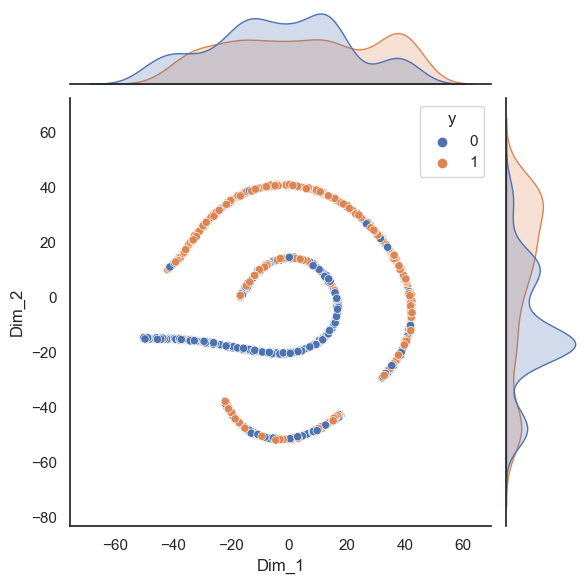

In [20]:
from sklearn.manifold import TSNE
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')



model = TSNE(n_components=2, random_state=0)
tsne_data = model.fit_transform(output)
tsne_df = pd.DataFrame(data=tsne_data, columns=("Dim_1", "Dim_2"))

tsne_df = pd.concat([tsne_df, df_test_y], axis=1)

sns.jointplot(data=tsne_df, x="Dim_1", y="Dim_2", hue='y')
plt.show()
warnings.filterwarnings('default')

# Checking similarities of encoded vectors

<AxesSubplot:>

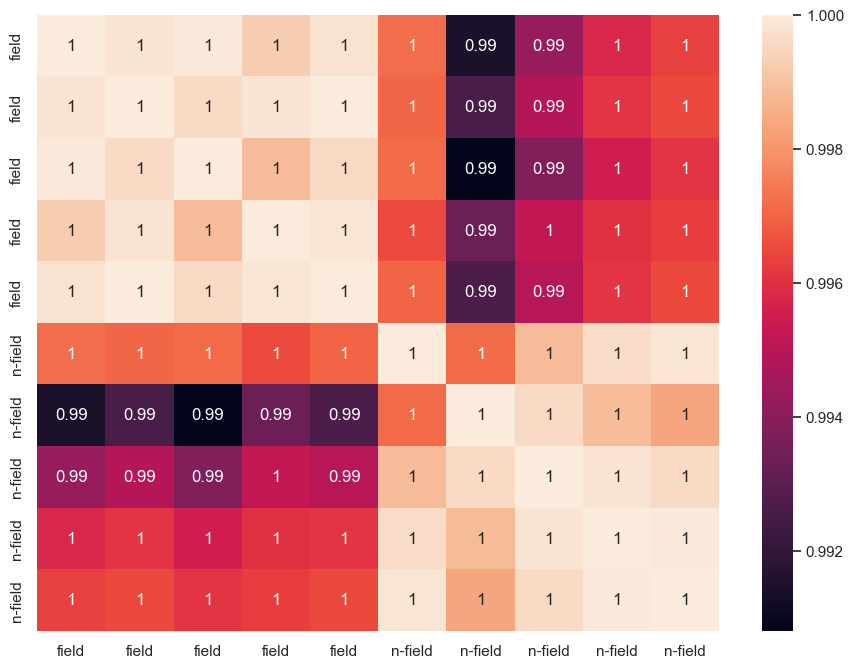

In [21]:
df_test = pd.DataFrame(output)
df_test = pd.concat([df_test,df_test_y,df_test_labels], axis=1)

df_sample_five_positive = df_test.loc[df_test['y'] == 1].head(5)
df_sample_five_negative = df_test.loc[df_test['y'] == 0].head(5)
df_subsample = pd.concat([df_sample_five_positive, df_sample_five_negative])
df_labels = np.concatenate((np.repeat('field',5), np.repeat('n-field', 5)))

df_subsample_norm = tf.math.l2_normalize(df_subsample, axis=1)
similarities = tf.matmul(df_subsample_norm, df_subsample_norm, transpose_b=True)

sns.heatmap(similarities.numpy(), xticklabels=df_labels, yticklabels=df_labels, annot=True )

In [22]:
df_validation = pd.concat(
            pd.read_parquet(parquet_file)
            for parquet_file in parquet_dir_validation.glob('*.parquet')
         )

print(df_validation.shape)

df_validation = df_validation.drop_duplicates(subset='hex', keep="first")

df_hexes = df_validation[['hex']]

df_validation = df_validation[['B01','B02','B03','B04','B05','B06','B07','B08','B8A','B09','B11','B12']].astype('int')

validation_output = encoder_model.predict(df_validation)
validation_similarities = cosine_similarity(validation_output, validation_output)

print(validation_similarities.shape)

(279006, 19)
154/154 [==============================] - 0s 802us/step
(4912, 4912)


<AxesSubplot:>

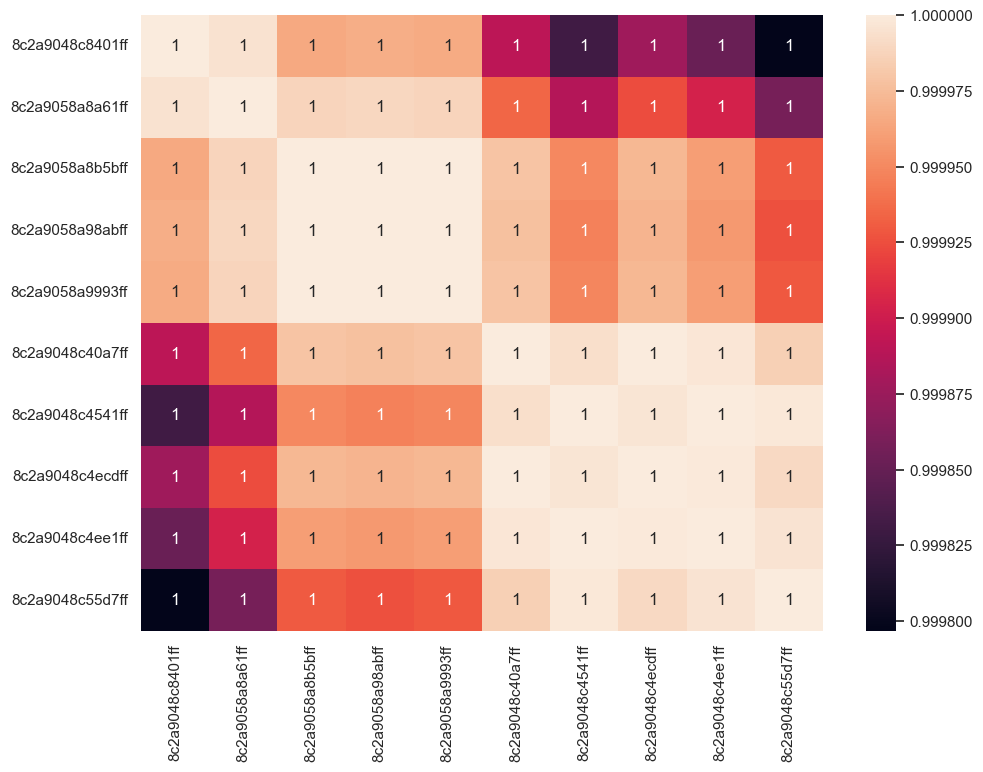

In [23]:
# Manually picked samples just for general observation of their similarities
positive_samples = [
                    '8c2a9048c40a7ff',
                    '8c2a9048c4541ff',
                    '8c2a9048c4ecdff',
                    '8c2a9048c4ee1ff',
                    '8c2a9048c55d7ff',
                   ]
     
negative_samples = [
                    '8c2a9048c8401ff',
                    '8c2a9058a9993ff',    
                    '8c2a9058a8a61ff',
                    '8c2a9058a98abff',
                    '8c2a9058a8b5bff',
                   ]

df_hexes.reset_index(inplace=True)
df_output_with_hexes = pd.concat([pd.DataFrame(data=validation_output),df_hexes], axis=1)
df_validation_positives = df_output_with_hexes.loc[df_output_with_hexes['hex'].isin(positive_samples)]
df_validation_negatives = df_output_with_hexes.loc[df_output_with_hexes['hex'].isin(negative_samples)]

df_labels = np.concatenate((df_validation_negatives.hex.to_numpy(), df_validation_positives.hex.to_numpy()))

df_subsample = pd.concat([df_validation_positives,df_validation_negatives]).drop('hex', axis=1)
similarities = cosine_similarity(df_subsample, df_subsample)

sns.heatmap(similarities, xticklabels=df_labels, yticklabels=df_labels, annot=True )

Once the similarities of positives samples are maximized and repealed from negative ones, try an unsupervised and a supervised approach to see how the vectors are processed by the algorithms

## Unsupervised

In [24]:
from sklearn.cluster import DBSCAN
import numpy as np

clustering = DBSCAN(metric='cosine', eps=0.00001, min_samples=40).fit(validation_output)
clustering.labels_

print(np.unique(clustering.labels_))

print(np.sum(clustering.labels_ == -1))
print(np.sum(clustering.labels_ == 0))
print(np.sum(clustering.labels_ == 1))

[-1  0  1]
106
4761
45


## Supervised

In [25]:
# Supervised finetuning of the pretrained encoder
finetuning_model = keras.Sequential(
    [
        layers.Input(shape=(image_size, image_channels)),
        get_augmenter(**classification_augmentation),
        pretraining_model.encoder,
        layers.Dense(2),
    ],
    name="finetuning_model",
)
finetuning_model.compile(
    optimizer=keras.optimizers.Adam(),
    loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=[keras.metrics.SparseCategoricalAccuracy(name="acc")],
)

finetuning_history = finetuning_model.fit(
    labeled_train_dataset, epochs=num_epochs, validation_data=test_dataset
)
print(
    "Maximal validation accuracy: {:.2f}%".format(
        max(finetuning_history.history["val_acc"]) * 100
    )
)

Epoch 1/100
28/28 [==============================] - 1s 7ms/step - loss: 1.6664 - acc: 0.5757 - val_loss: 0.6120 - val_acc: 0.7753
Epoch 2/100
28/28 [==============================] - 0s 2ms/step - loss: 0.6111 - acc: 0.7186 - val_loss: 0.6129 - val_acc: 0.7843
Epoch 3/100
28/28 [==============================] - 0s 2ms/step - loss: 0.6044 - acc: 0.7136 - val_loss: 0.6135 - val_acc: 0.7857
Epoch 4/100
28/28 [==============================] - 0s 2ms/step - loss: 0.5944 - acc: 0.7371 - val_loss: 0.6042 - val_acc: 0.7427
Epoch 5/100
28/28 [==============================] - 0s 2ms/step - loss: 0.6063 - acc: 0.6943 - val_loss: 0.6501 - val_acc: 0.6879
Epoch 6/100
28/28 [==============================] - 0s 3ms/step - loss: 0.6251 - acc: 0.7029 - val_loss: 0.6237 - val_acc: 0.7621
Epoch 7/100
28/28 [==============================] - 0s 3ms/step - loss: 0.6282 - acc: 0.6800 - val_loss: 0.6386 - val_acc: 0.7150
Epoch 8/100
28/28 [==============================] - 0s 3ms/step - loss: 0.6390 - a

In [26]:
df_classes = pd.DataFrame(clustering.labels_, columns=['class'])

df_hexes = df_hexes.reset_index(drop=True)
df_classes = df_classes.reset_index(drop=True)

df_predict = pd.concat([df_hexes,df_classes], axis=1)

center = h3.h3_to_geo_boundary(h=df_predict.iloc[0]['hex'],geo_json=True)

m = folium.Map(location=(center[0][1], center[0][0]),
                tiles = 'https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
                attr = 'Esri',
                name = 'Esri Satellite',
                overlay = False,
                control = True)

for index, row in df_predict.iterrows():
    geometry = { "type" : "Polygon", "coordinates": [h3.h3_to_geo_boundary(h=row['hex'],geo_json=True)]}
    
    if row['class'] == 0:
        geo_j = folium.GeoJson(data=geometry, style_function=lambda x: {'fillColor': 'green', 'color': 'green', 'weight': 0.5})
    elif row['class'] == 1:
        geo_j = folium.GeoJson(data=geometry, style_function=lambda x: {'fillColor': 'blue', 'color': 'green', 'weight': 0.5})
    elif row['class'] == 2:
        geo_j = folium.GeoJson(data=geometry, style_function=lambda x: {'fillColor': 'yellow', 'color': 'green', 'weight': 0.5})    
    elif row['class'] == 3:
        geo_j = folium.GeoJson(data=geometry, style_function=lambda x: {'fillColor': 'red', 'color': 'green', 'weight': 0.5})    
    else:
        geo_j = folium.GeoJson(data=geometry, style_function=lambda x: {'fillColor': 'black', 'color': 'red', 'weight': 0.5})
    folium.Popup(str(row['hex'])).add_to(geo_j)
    geo_j.add_to(m)

m

# End of Notebook